# **Семинар 8**. Сегментация + UNet

Сегодня научимся сегментировать изображения на примере задачи отделения людей от заднего фона. В качестве модели будем использовать UNet-подобную сеть.

## План:

1. Данные для сегментации
2. UNet: 
    * Encoder
    * Decoder
    * Все вместе
3. Dice / Dice Loss
4. *UNet34

In [1]:
import matplotlib.pyplot   as plt
import torch.nn.functional as F
import torch.optim         as optim
import torch.nn            as nn
import numpy               as np

import torch
import glob
import cv2
import os

from torch.utils.data import Dataset, DataLoader

import torchvision.transforms as transforms
import torchvision.models     as models
import torch.utils.data       as data
import torch.utils.data       as data

import albumentations as A
import albumentations.pytorch

import warnings
warnings.filterwarnings('ignore')

### 1. Данные для сегментации

Будем использовать данные с первого этапа **PicsArt AI Hackathon**. Скачать [тут](https://drive.google.com/file/d/1Zc8iMETenxtk10GQEeNyMDY5PST7izjv/view?usp=sharing).
- Загрузим и распакуем данные
- Напишем класс `Dataset` для наших данных
- Посмотрим примеры данных

In [2]:
class HumanSegmentationDataset(Dataset):
    
    def __init__(self, root, split="train", transform=None):
        
        image_filenames = sorted(glob.glob(os.path.join(root, split, "*.jpg")))
        mask_filenames = []
        
        if split != "test":
            mask_filenames = []
            for image_fn in image_filenames:
                mask_fn = image_fn.replace(split, f"{split}_mask").replace("jpg", "png")
                if not os.path.exists(mask_fn):
                    raise FileNotFoundError(mask_fn)
                mask_filenames.append(mask_fn)
                
        self.image_filenames = image_filenames
        self.mask_filenames = mask_filenames
        self.transform = transform
        self.split = split
        
    def __getitem__(self, idx):
        
        # write some code here
        image = cv2.imread(self.image_filenames[idx]).astype(np.float32) / 255.
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        mask = None
        if self.split != "test":
            mask = cv2.imread(self.mask_filenames[idx], cv2.IMREAD_GRAYSCALE) / 255
            
        if self.transform is not None:
            transformed = self.transform(image=image, mask=mask)
            
        image = transformed["image"]
        mask = transformed["mask"]
        mask = mask[None, ...]

        return image, mask


    def __len__(self):
        return len(self.image_filenames)

In [3]:
transform = A.Compose([
    A.pytorch.transforms.ToTensorV2(transpose_mask=True),
])

In [4]:
train_dataset = HumanSegmentationDataset(root="data", transform=transform)
valid_dataset = HumanSegmentationDataset(root="data", transform=transform, split="valid")
test_dataset  = HumanSegmentationDataset(root="data", transform=transform, split="test")

In [5]:
image, mask = train_dataset[0]

In [6]:
# check the output
image.shape, mask.shape

(torch.Size([3, 320, 240]), torch.Size([1, 320, 240]))

In [7]:
def show_image_with_mask(image, mask, predicted=None):
    
    image = (image * 255).astype(np.uint8)
    mask = (mask >= 0.5).astype(np.uint8) * 255
    
    plt.figure(figsize=(20, 8))
    
    plt.subplot(1, 6, 1)
    plt.imshow(image)
    plt.axis(False)

    plt.subplot(1, 6, 2)
    plt.imshow(mask)
    plt.axis(False)

    plt.subplot(1, 6, 3)
    image_masked = cv2.bitwise_and(image, image, mask=mask)
    plt.imshow(image_masked)
    plt.axis(False)

    if predicted is not None:
        predicted = (predicted * 255).astype(np.uint8)
        plt.subplot(1, 6, 4)
        plt.imshow(predicted)
        plt.axis(False)
        
        predicted_binary = (predicted >= 0.5 * 255).astype(np.uint8) * 255
        plt.subplot(1, 6, 5)
        plt.imshow(predicted_binary)
        plt.axis(False)
    
        image_masked = cv2.bitwise_and(image, image, mask=predicted_binary)
        plt.subplot(1, 6, 6)
        plt.imshow(image_masked)
        plt.axis(False)
    
    plt.show()

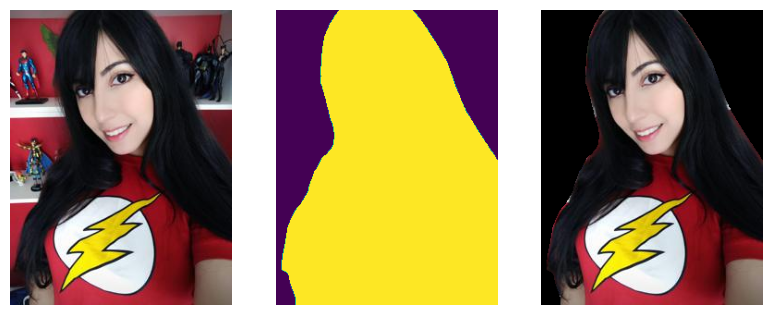

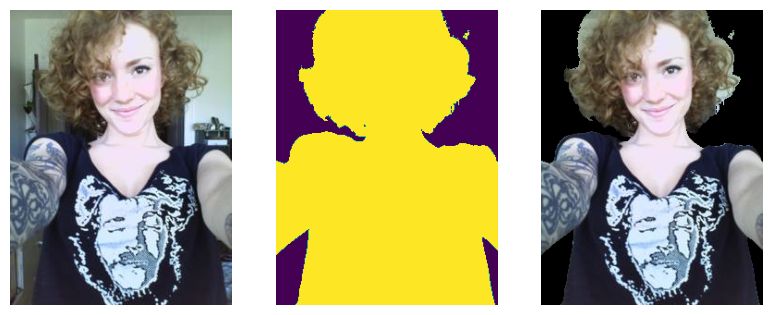

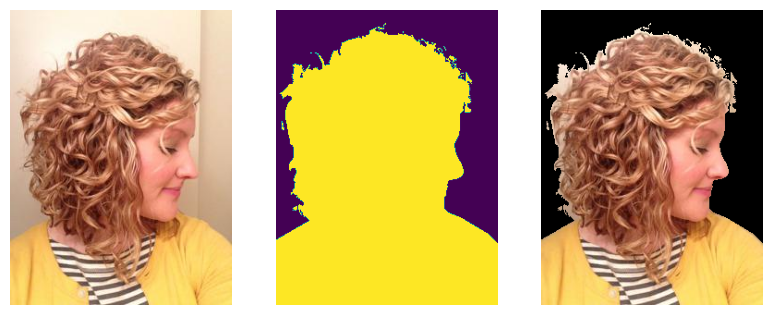

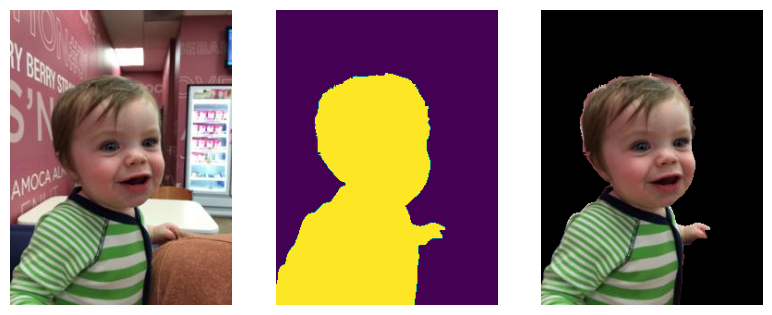

In [8]:
idxs = np.random.randint(0, len(train_dataset), 4)

sample_dataset = [train_dataset[i] for i in idxs]
sample_dataset = [(image.numpy().transpose(1, 2, 0), mask.numpy()[0]) for (image, mask) in sample_dataset]

for image, mask in sample_dataset:
    show_image_with_mask(image, mask)

### 2. Собираем UNet

![unet](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png)

#### 2.1. Encoder

In [9]:
def conv3x3(in_channels, out_channels, dilation=1):
    return nn.Conv2d(in_channels, out_channels, 3, padding=dilation, dilation=dilation)

Один **блок кодировщика** состоит из двух сверток, активаций и опционального батчнорма. **Блок не изменяет размеров HxW** входного тензора (это будем делать снаружи):

In [10]:
class EncoderBlock(nn.Module):
    
    def __init__(self, in_channels, out_channels, batch_norm=False):
        super().__init__()
        
        self.batch_norm = batch_norm
        self.conv1 = conv3x3(in_channels, out_channels)
        
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        
        self.relu1 = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(out_channels, out_channels)
        
        self.relu2 = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv1(x)
        
        if self.batch_norm:
            x = self.bn(x)
        
        x = self.relu1(x)
        x = self.conv2(x)
        
        if self.batch_norm:
            x = self.bn(x)
        
        x = self.relu2(x)
        return x

In [11]:
block = EncoderBlock(3, 16)
block

EncoderBlock(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1): ReLU(inplace=True)
  (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2): ReLU(inplace=True)
)

In [12]:
x = torch.zeros(4, 3, 128, 128)

with torch.no_grad():
    print(block(x).shape)

torch.Size([4, 16, 128, 128])


Напишем класс энкодера, который и будет состоять из блоков.

**Задача 1**: реализовать конструктор класса `Encoder`.
* `num_filters` - это характерный размер блоков сети ("ширина"). В первом блоке должно быть `num_filters` признаков, во втором - вдвое больше, и т.д.
* `num_blocks` - количество блоков, после каждого блока стоит MaxPool2d (кроме последнего блока).


**Задача 2**: реализовать метод `forward` класса `Encoder`.
* Должен вернуть список с активациями каждого блока энкодера

In [13]:
class Encoder(nn.Module):
    
    def __init__(self, in_channels, num_filters, num_blocks):
        super().__init__()
        
        blocks = []
        for i in range(num_blocks):
            block = EncoderBlock(in_channels, num_filters *(2**i))
            in_channels = num_filters *(2**i)
            blocks.append(block)
            
        self.blocks = nn.Sequential(*blocks)
        self.pool = nn.MaxPool2d(2)

    def forward(self, x):
        acts = []
        
        for i, block in enumerate(self.blocks):
            x = block(x)
            acts.append(x)
            if i != len(self.blocks)-1:
                x = self.pool(x)
        
        return acts

In [14]:
encoder = Encoder(in_channels=3, num_filters=16, num_blocks=4)

assert len(encoder.blocks) == 4

In [15]:
x = torch.zeros(4, 3, 512, 512)
y = encoder(x)

assert len(y) == 4

assert y[0].size() == (4, 16, 512, 512)
assert y[1].size() == (4, 32, 256, 256)
assert y[2].size() == (4, 64, 128, 128)
assert y[3].size() == (4, 128, 64, 64)

In [16]:
print(encoder)

Encoder(
  (blocks): Sequential(
    (0): EncoderBlock(
      (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu1): ReLU(inplace=True)
      (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu2): ReLU(inplace=True)
    )
    (1): EncoderBlock(
      (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu1): ReLU(inplace=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu2): ReLU(inplace=True)
    )
    (2): EncoderBlock(
      (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu1): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu2): ReLU(inplace=True)
    )
    (3): EncoderBlock(
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu1): ReLU(inplace=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), 

#### 2.2. Decoder

С декодером несколько интереснее, каждый блок получает на вход 2 тензора, один "слева" (из ветки энкодера) и один "снизу" (из предыдушего блока декодера). Далее "нижний" тензор увеличивается в размерах (HxW) вдвое, конкатенируется с "левым" и сворачивается. Мы будем использовать самый простой вариант **билинейной интерполяции**:

In [17]:
class DecoderBlock(nn.Module):
    
    def __init__(self, out_channels):
        super().__init__()

        self.uppool = nn.Upsample(scale_factor=2, mode='bilinear')
        self.upconv = conv3x3(out_channels*2, out_channels)
        self.conv1 = conv3x3(out_channels*2, out_channels)

    def forward(self, down, left):
        x = self.uppool(down)
        x = self.upconv(x)
        x = torch.cat([x, left], 1)
        x = self.conv1(x)
        return x

![interp](https://matplotlib.org/stable/_images/sphx_glr_interpolation_methods_001.png)

Напишем теперь и декодер:

**Задача 3**: реализовать конструктор класса `Decoder`.
* `num_filters` - это характерный размер блоков сети ("ширина"). В первом блоке должно быть `num_filters` признаков, во втором - вдвое больше, и т.д.
* `num_blocks` - количество блоков, после каждого блока стоит MaxPool2d (кроме последнего блока).


**Задача 4**: реализовать метод `forward` класса `Decoder`.
* Должен получить активации из энкодера и вернуть один тензор

**NB**: Обратите внимание, что для корректной "склейки" у энкодера должно быть на 1 блок больше, чем у декодера.

In [18]:
class Decoder(nn.Module):
    
    def __init__(self, num_filters, num_blocks):
        super().__init__()
        
        blocks = list()
        for i in range(num_blocks):
            block = DecoderBlock(num_filters*(2**i))
            blocks.append(block)

        blocks = blocks[::-1]        
        
        #self.blocks = nn.Sequential(*blocks)
        self.blocks = nn.ModuleList(blocks)
    
    def forward(self, acts):
        
        up = acts[-1]

        for i, act in enumerate(acts[::-1][1:]):
            up = self.blocks[i](up, act)
       
        return up

In [19]:
decoder = Decoder(16, 3)

assert len(decoder.blocks) == 3

In [20]:
y_dec = decoder(y)

assert y_dec.size() == (4, 16, 512, 512)

In [21]:
decoder

Decoder(
  (blocks): ModuleList(
    (0): DecoderBlock(
      (uppool): Upsample(scale_factor=2.0, mode='bilinear')
      (upconv): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (conv1): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (1): DecoderBlock(
      (uppool): Upsample(scale_factor=2.0, mode='bilinear')
      (upconv): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (conv1): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (2): DecoderBlock(
      (uppool): Upsample(scale_factor=2.0, mode='bilinear')
      (upconv): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (conv1): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
  )
)

In [22]:
decoder(encoder(x)).shape

torch.Size([4, 16, 512, 512])

### 2.3. UNet

Осталось соединить энкодер с декодером и добавить вишенку на торте - выходную свертку в нужное число классов:

In [23]:
class UNet(nn.Module):
    
    def __init__(self, num_classes, in_channels=3, num_filters=16, num_blocks=4):
        super().__init__()

        self.encoder = Encoder(in_channels, num_filters, num_blocks)
        self.decoder = Decoder(num_filters, num_blocks-1)
        self.final = nn.Conv2d(num_filters, num_classes, 1)

    def forward(self, x):
        acts = self.encoder(x)
        x = self.decoder(acts)
        x = self.final(x)
        return x

In [24]:
model = UNet(num_classes=1)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

UNet(
  (encoder): Encoder(
    (blocks): Sequential(
      (0): EncoderBlock(
        (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu1): ReLU(inplace=True)
        (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu2): ReLU(inplace=True)
      )
      (1): EncoderBlock(
        (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu1): ReLU(inplace=True)
        (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu2): ReLU(inplace=True)
      )
      (2): EncoderBlock(
        (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu1): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu2): ReLU(inplace=True)
      )
      (3): EncoderBlock(
        (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu1): ReLU(inp

In [25]:
images = torch.randn(4, 3, 416, 416).to(device)

model(images).size()

torch.Size([4, 1, 416, 416])

## 3. Dice / Dice Loss

В базовом случае для обучения семантической сегментации используют попиксельный BCE. Для отслеживания качества сегментации можно использовать IoU для масок или его непрерывную аппроксимацию - Dice coeff:

![dice](oK8npb1wtF-GKeHi7yIBoQ.png)

![dice](EF3VCtk-VbTIKhriaQF0YQ.png)

**Задача 5**: Реализуйте функцию для вычисления Dice Coeff:

In [26]:
def dice_coeff(pred_tensor, target_tensor):
    smooth = 0.0001
    intersection = (pred_tensor*target_tensor).sum()
    union = pred_tensor.sum() + target_tensor.sum()
    
    return 2 * (intersection + smooth) / (union + smooth)

Время обучать!

В рамках семинара просто посмотрим, что модель переобучается под данные. В качестве трейна и теста будем использовать тестовый датасет. Но вы, конечно, так не делайте и попробуйте поучить на настоящем трейне, а потеститься на тесте.

In [27]:
def train_epoch(model, optimizer, train_loader, criterion, device):
    """
    for each batch 
    performs forward and backward pass and parameters update 
    
    Input:
    model: instance of model (example defined above)
    optimizer: instance of optimizer (defined above)
    train_loader: instance of DataLoader
    
    Returns:
    nothing
    
    Do not forget to set net to train mode!
    """
    model.train()
    
    for batch_train, batch_answers in train_loader:
        batch_train = batch_train.to(device)
        batch_answers = batch_answers.to(device)
        
        optimizer.zero_grad()
        
        model_answers = model(batch_train)
        
        new_loss = criterion(model_answers, batch_answers)
        new_loss.backward()
        optimizer.step()      

def evaluate_loss(loader, model, criterion, device):
    """
    Evaluates loss and accuracy on the whole dataset
    
    Input:
    loader:  instance of DataLoader
    model: instance of model (examle defined above)
    
    Returns: (loss, accuracy)
    
    Do not forget to set net to eval mode!
    """
    model.eval()
    
    total_loss = 0
    total_dice = 0
    total_n = 0
    
    with torch.no_grad():
        for batch_test, batch_answers in loader:
            batch_test = batch_test.to(device)
            batch_answers = batch_answers.to(device)
            
            model_answers = torch.sigmoid(model(batch_test))
            one_batch_loss = float(criterion(model_answers, batch_answers))
            one_batch_dice = float(dice_coeff(model_answers.cpu().detach(), batch_answers.cpu().detach()))
            
            total_loss += one_batch_loss
            total_dice += one_batch_dice
            total_n += 1
    
    return (total_loss / total_n, total_dice / total_n)

In [28]:
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=32)
test_loader  = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=32)

Epoch 0: avg train loss 0.689, avg dice 0.606


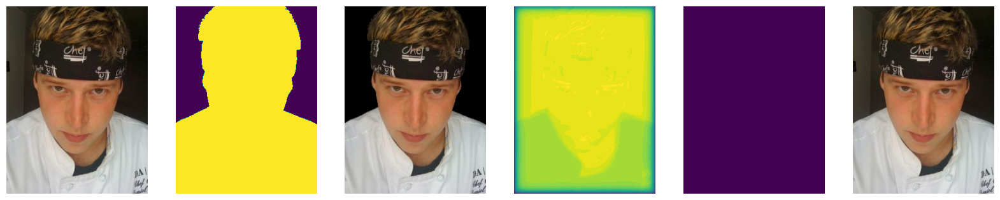

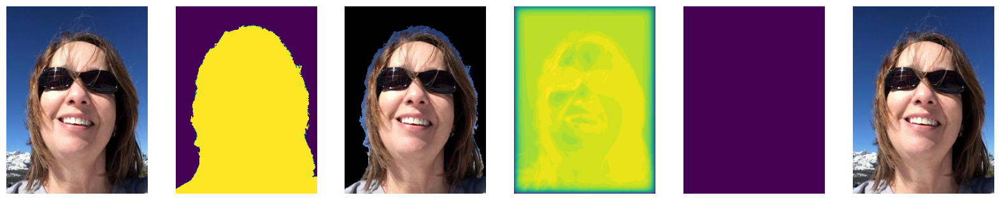

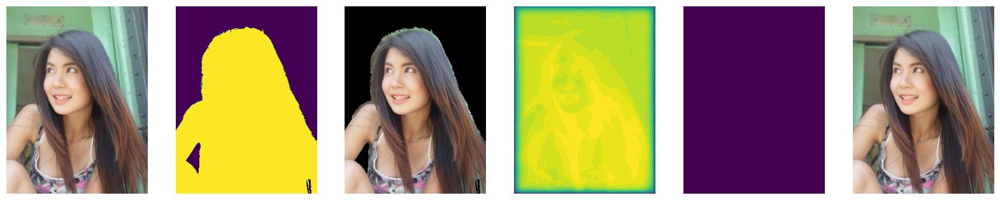

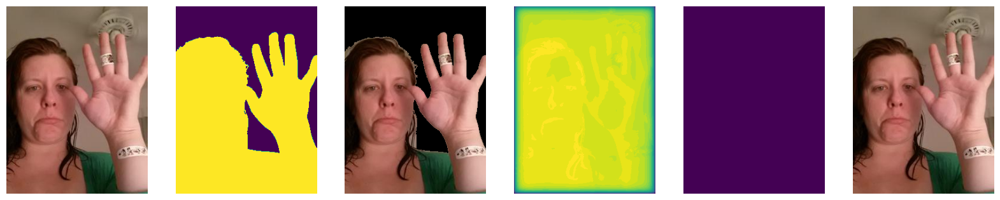

Epoch 1: avg train loss 0.682, avg dice 0.577
Epoch 2: avg train loss 0.663, avg dice 0.696
Epoch 3: avg train loss 0.663, avg dice 0.586
Epoch 4: avg train loss 0.660, avg dice 0.666
Epoch 5: avg train loss 0.649, avg dice 0.665
Epoch 6: avg train loss 0.641, avg dice 0.672
Epoch 7: avg train loss 0.635, avg dice 0.690
Epoch 8: avg train loss 0.633, avg dice 0.719
Epoch 9: avg train loss 0.625, avg dice 0.750
Epoch 10: avg train loss 0.637, avg dice 0.725
Epoch 11: avg train loss 0.619, avg dice 0.748
Epoch 12: avg train loss 0.616, avg dice 0.709
Epoch 13: avg train loss 0.605, avg dice 0.726
Epoch 14: avg train loss 0.608, avg dice 0.740
Epoch 15: avg train loss 0.600, avg dice 0.721
Epoch 16: avg train loss 0.608, avg dice 0.755


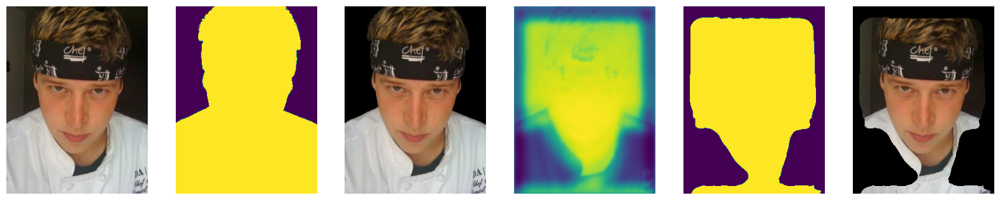

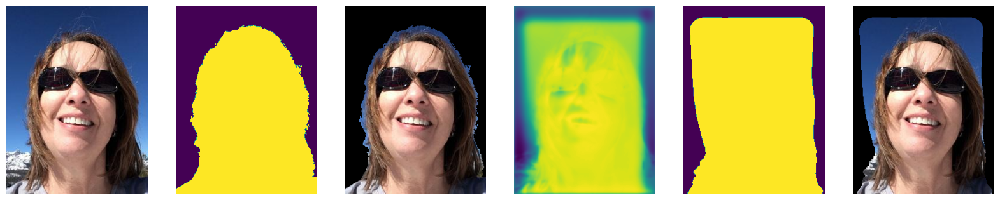

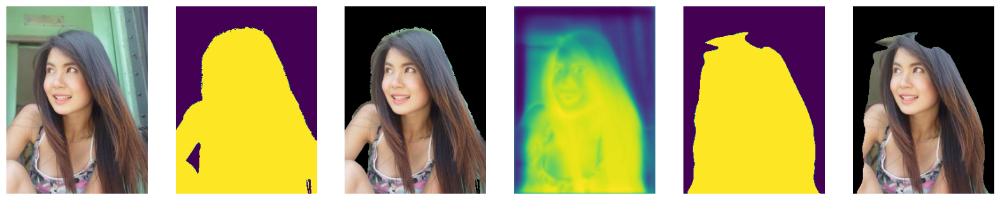

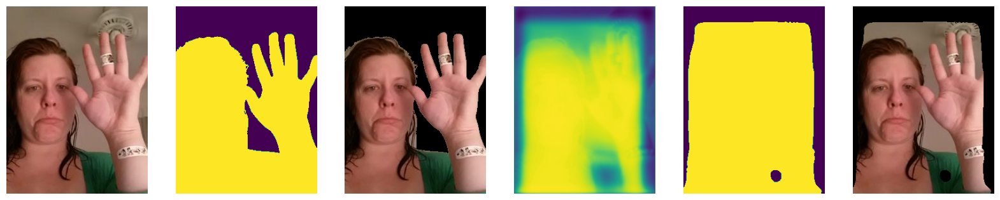

Epoch 17: avg train loss 0.602, avg dice 0.726
Epoch 18: avg train loss 0.599, avg dice 0.756
Epoch 19: avg train loss 0.594, avg dice 0.756
Epoch 20: avg train loss 0.599, avg dice 0.767
Epoch 21: avg train loss 0.596, avg dice 0.734
Epoch 22: avg train loss 0.596, avg dice 0.767
Epoch 23: avg train loss 0.593, avg dice 0.769
Epoch 24: avg train loss 0.592, avg dice 0.772
Epoch 25: avg train loss 0.593, avg dice 0.776
Epoch 26: avg train loss 0.595, avg dice 0.729
Epoch 27: avg train loss 0.587, avg dice 0.750
Epoch 28: avg train loss 0.588, avg dice 0.771
Epoch 29: avg train loss 0.586, avg dice 0.788
Epoch 30: avg train loss 0.584, avg dice 0.792
Epoch 31: avg train loss 0.584, avg dice 0.769
Epoch 32: avg train loss 0.593, avg dice 0.779


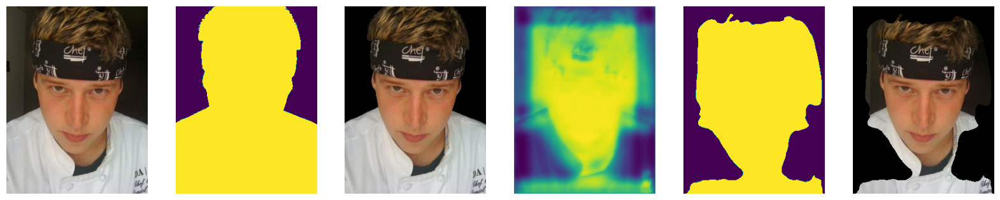

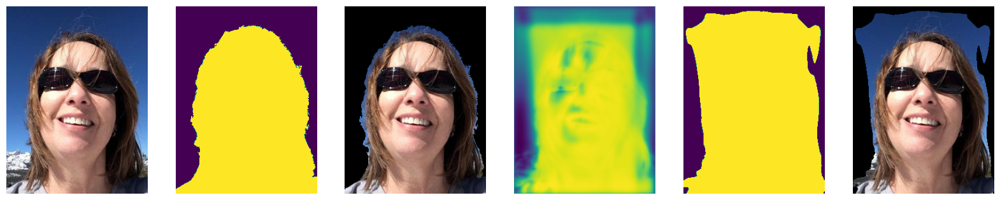

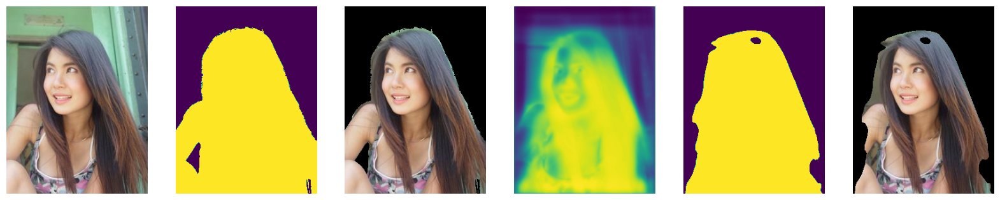

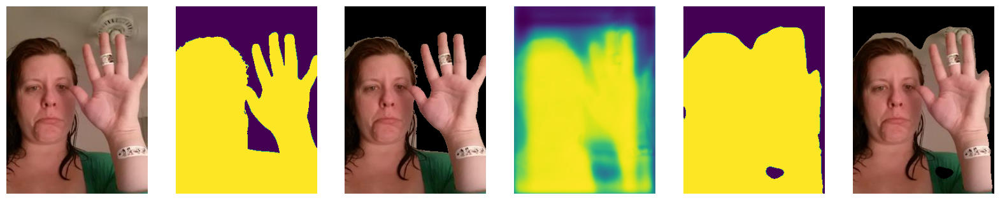

Epoch 33: avg train loss 0.600, avg dice 0.775
Epoch 34: avg train loss 0.583, avg dice 0.802
Epoch 35: avg train loss 0.590, avg dice 0.764
Epoch 36: avg train loss 0.574, avg dice 0.806
Epoch 37: avg train loss 0.585, avg dice 0.770
Epoch 38: avg train loss 0.575, avg dice 0.812
Epoch 39: avg train loss 0.593, avg dice 0.739
Epoch 40: avg train loss 0.570, avg dice 0.782
Epoch 41: avg train loss 0.585, avg dice 0.800
Epoch 42: avg train loss 0.567, avg dice 0.812
Epoch 43: avg train loss 0.587, avg dice 0.747
Epoch 44: avg train loss 0.582, avg dice 0.742
Epoch 45: avg train loss 0.586, avg dice 0.723
Epoch 46: avg train loss 0.574, avg dice 0.775
Epoch 47: avg train loss 0.580, avg dice 0.776
Epoch 48: avg train loss 0.573, avg dice 0.812


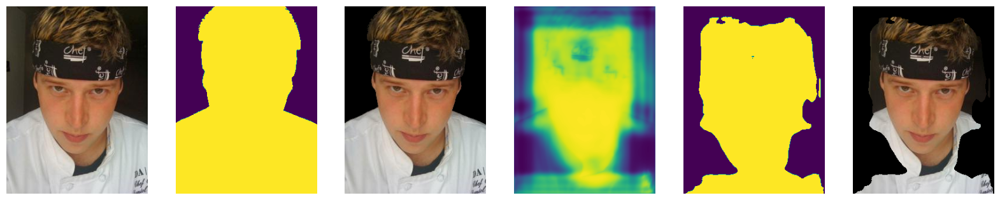

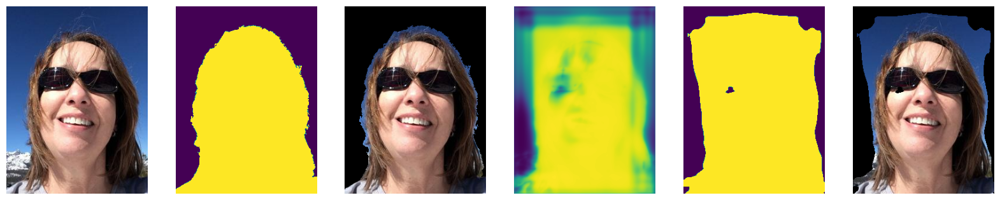

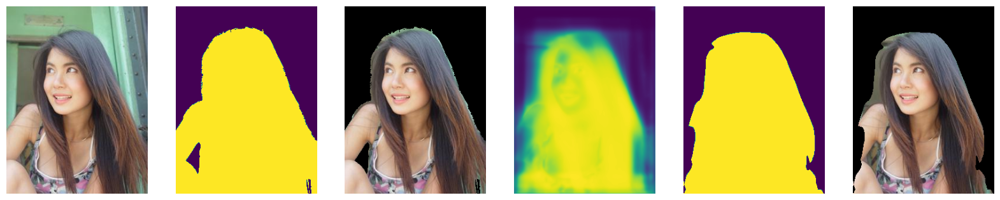

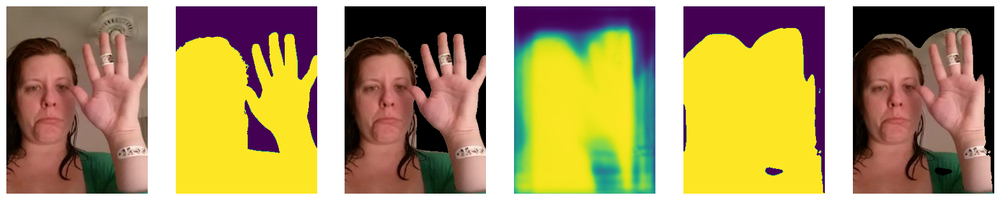

Epoch 49: avg train loss 0.577, avg dice 0.809
Epoch 50: avg train loss 0.568, avg dice 0.809
Epoch 51: avg train loss 0.567, avg dice 0.797
Epoch 52: avg train loss 0.562, avg dice 0.824
Epoch 53: avg train loss 0.563, avg dice 0.827
Epoch 54: avg train loss 0.566, avg dice 0.830
Epoch 55: avg train loss 0.558, avg dice 0.809
Epoch 56: avg train loss 0.566, avg dice 0.834
Epoch 57: avg train loss 0.572, avg dice 0.766
Epoch 58: avg train loss 0.558, avg dice 0.805
Epoch 59: avg train loss 0.560, avg dice 0.828
Epoch 60: avg train loss 0.554, avg dice 0.831
Epoch 61: avg train loss 0.557, avg dice 0.830
Epoch 62: avg train loss 0.548, avg dice 0.831
Epoch 63: avg train loss 0.557, avg dice 0.845
Epoch 64: avg train loss 0.566, avg dice 0.767


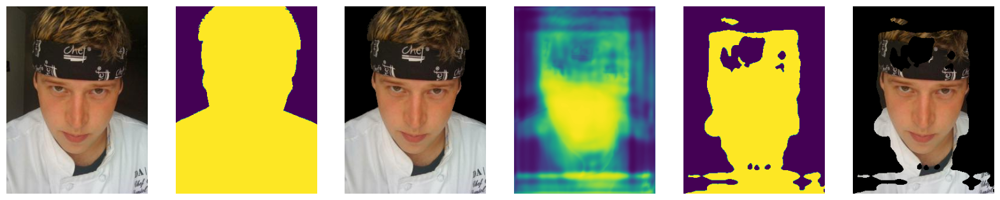

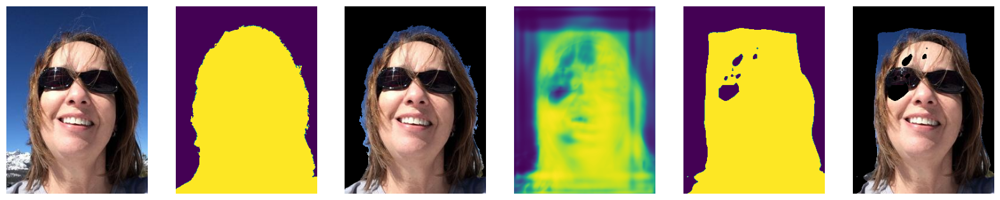

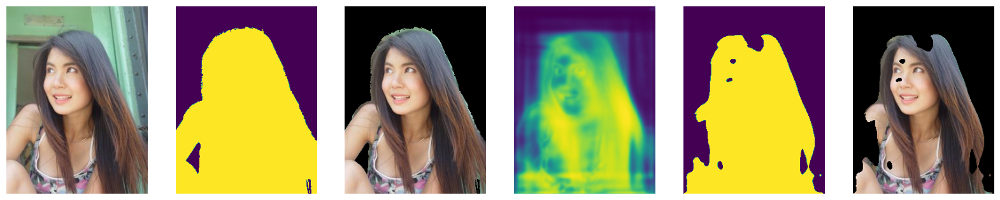

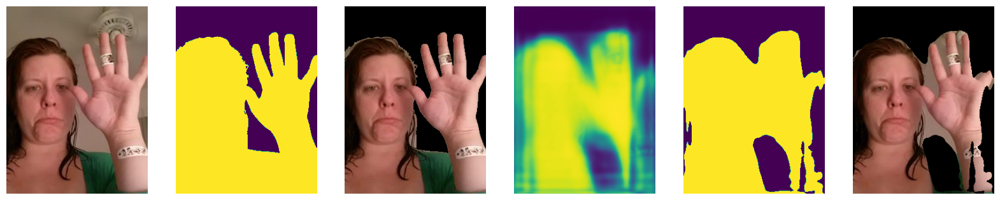

Epoch 65: avg train loss 0.555, avg dice 0.847
Epoch 66: avg train loss 0.561, avg dice 0.834
Epoch 67: avg train loss 0.556, avg dice 0.830
Epoch 68: avg train loss 0.552, avg dice 0.834
Epoch 69: avg train loss 0.544, avg dice 0.845
Epoch 70: avg train loss 0.553, avg dice 0.857
Epoch 71: avg train loss 0.551, avg dice 0.811
Epoch 72: avg train loss 0.554, avg dice 0.848
Epoch 73: avg train loss 0.544, avg dice 0.866
Epoch 74: avg train loss 0.545, avg dice 0.842
Epoch 75: avg train loss 0.540, avg dice 0.863
Epoch 76: avg train loss 0.539, avg dice 0.866
Epoch 77: avg train loss 0.539, avg dice 0.861
Epoch 78: avg train loss 0.539, avg dice 0.849
Epoch 79: avg train loss 0.550, avg dice 0.868
Epoch 80: avg train loss 0.560, avg dice 0.801


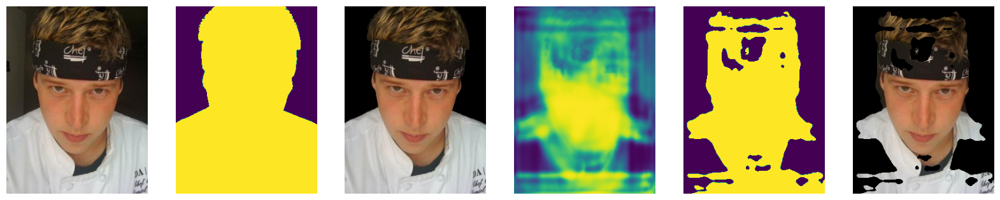

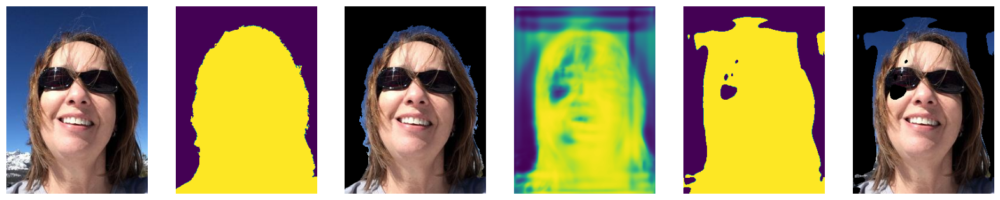

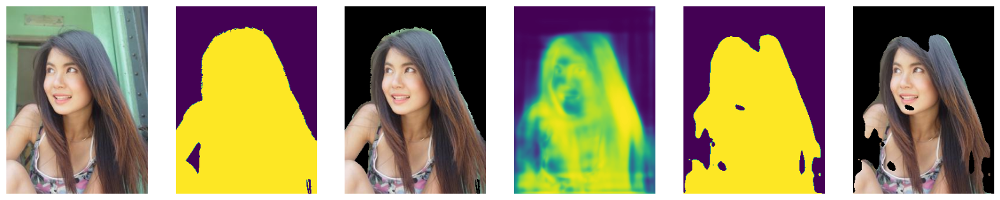

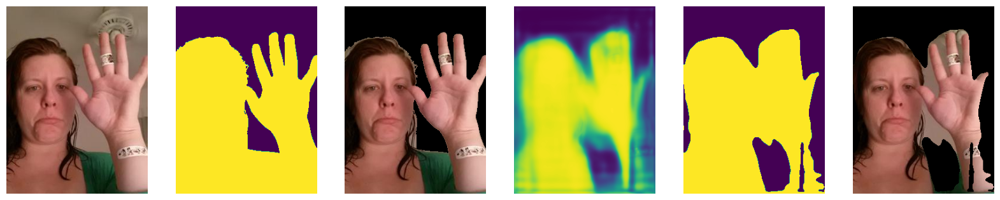

Epoch 81: avg train loss 0.547, avg dice 0.857
Epoch 82: avg train loss 0.541, avg dice 0.861
Epoch 83: avg train loss 0.548, avg dice 0.847
Epoch 84: avg train loss 0.534, avg dice 0.880
Epoch 85: avg train loss 0.534, avg dice 0.871
Epoch 86: avg train loss 0.535, avg dice 0.879
Epoch 87: avg train loss 0.536, avg dice 0.879
Epoch 88: avg train loss 0.532, avg dice 0.866
Epoch 89: avg train loss 0.533, avg dice 0.888
Epoch 90: avg train loss 0.530, avg dice 0.881
Epoch 91: avg train loss 0.536, avg dice 0.888
Epoch 92: avg train loss 0.536, avg dice 0.862
Epoch 93: avg train loss 0.539, avg dice 0.883
Epoch 94: avg train loss 0.546, avg dice 0.876
Epoch 95: avg train loss 0.539, avg dice 0.877
Epoch 96: avg train loss 0.542, avg dice 0.881


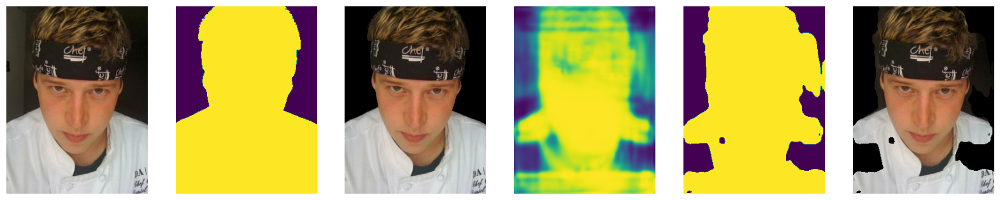

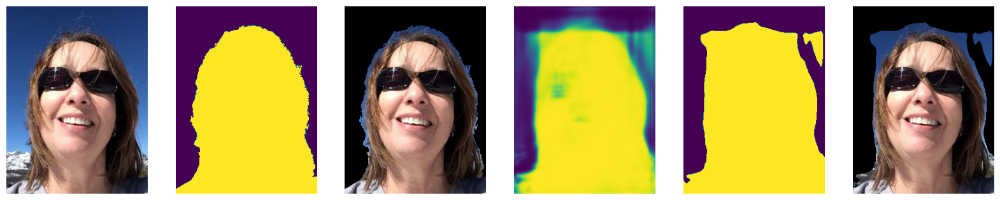

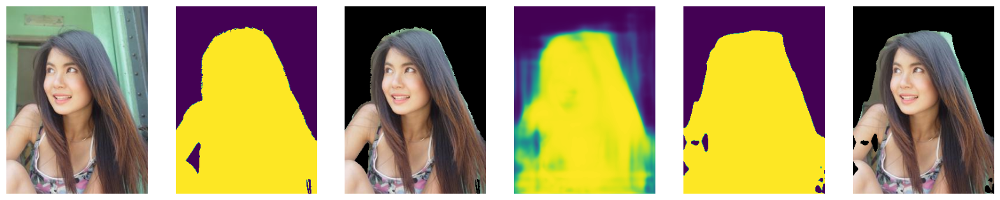

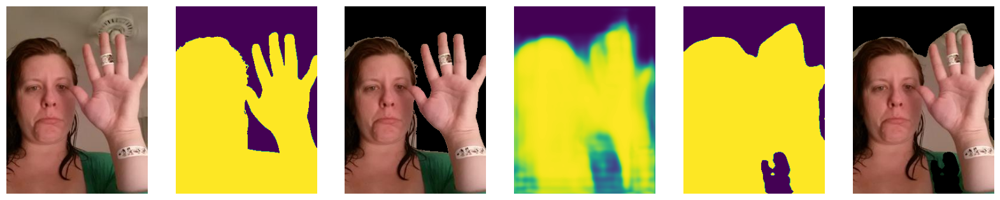

Epoch 97: avg train loss 0.537, avg dice 0.893
Epoch 98: avg train loss 0.548, avg dice 0.879
Epoch 99: avg train loss 0.557, avg dice 0.872
Epoch 100: avg train loss 0.581, avg dice 0.848
Epoch 101: avg train loss 0.559, avg dice 0.846
Epoch 102: avg train loss 0.562, avg dice 0.843
Epoch 103: avg train loss 0.545, avg dice 0.841
Epoch 104: avg train loss 0.540, avg dice 0.869
Epoch 105: avg train loss 0.534, avg dice 0.884
Epoch 106: avg train loss 0.537, avg dice 0.894
Epoch 107: avg train loss 0.547, avg dice 0.888
Epoch 108: avg train loss 0.559, avg dice 0.874
Epoch 109: avg train loss 0.545, avg dice 0.875
Epoch 110: avg train loss 0.540, avg dice 0.827
Epoch 111: avg train loss 0.537, avg dice 0.868
Epoch 112: avg train loss 0.527, avg dice 0.899


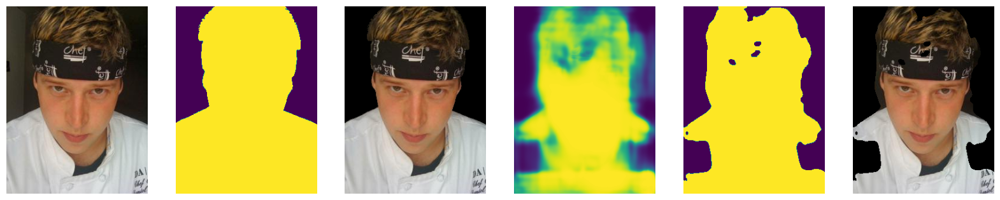

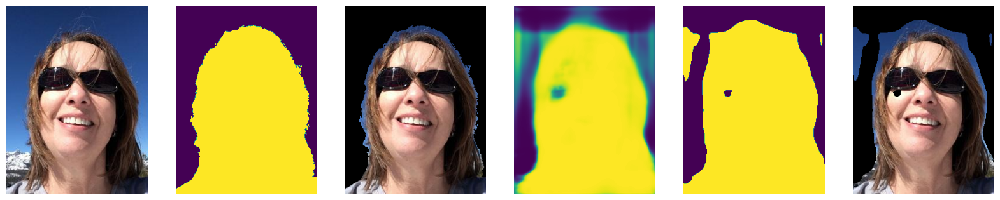

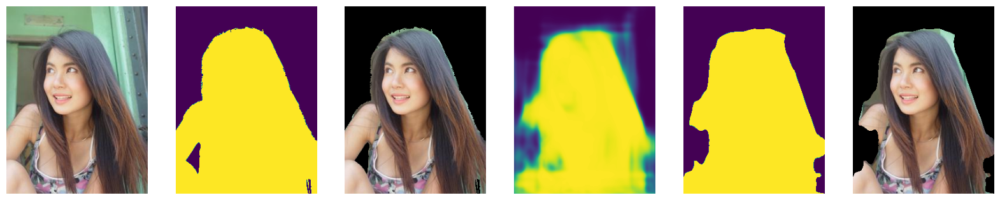

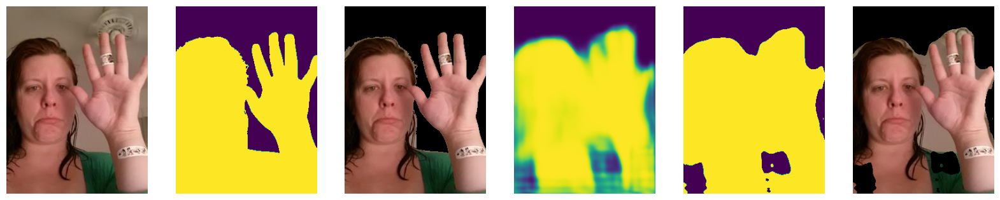

Epoch 113: avg train loss 0.532, avg dice 0.897
Epoch 114: avg train loss 0.529, avg dice 0.900
Epoch 115: avg train loss 0.519, avg dice 0.909
Epoch 116: avg train loss 0.519, avg dice 0.906
Epoch 117: avg train loss 0.516, avg dice 0.913
Epoch 118: avg train loss 0.519, avg dice 0.898
Epoch 119: avg train loss 0.516, avg dice 0.894
Epoch 120: avg train loss 0.518, avg dice 0.887
Epoch 121: avg train loss 0.525, avg dice 0.875
Epoch 122: avg train loss 0.520, avg dice 0.895
Epoch 123: avg train loss 0.521, avg dice 0.898
Epoch 124: avg train loss 0.514, avg dice 0.921
Epoch 125: avg train loss 0.514, avg dice 0.908
Epoch 126: avg train loss 0.512, avg dice 0.921
Epoch 127: avg train loss 0.511, avg dice 0.927
Epoch 128: avg train loss 0.512, avg dice 0.930


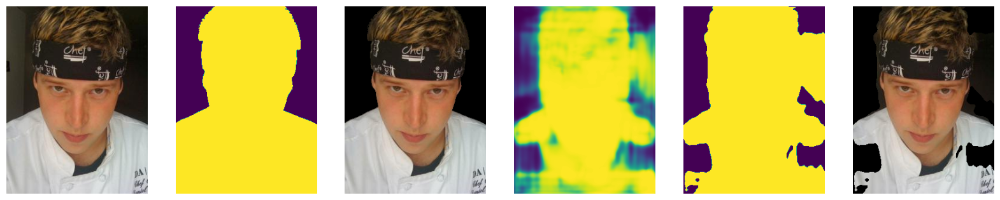

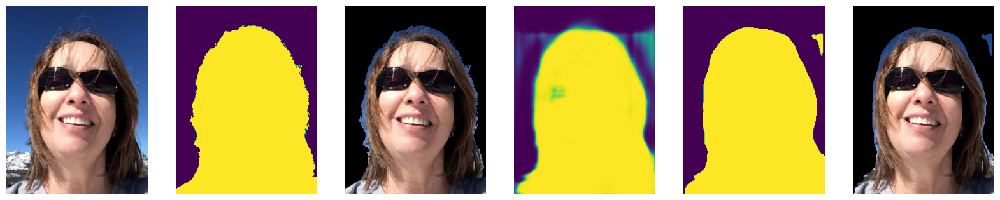

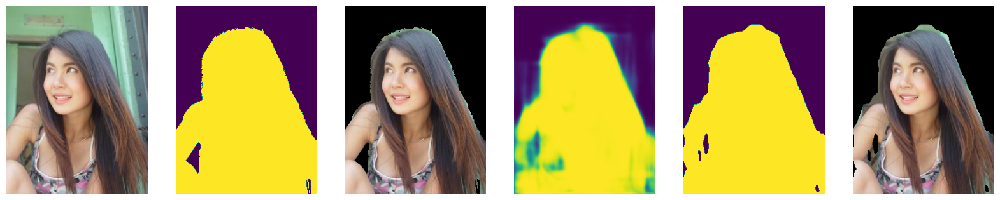

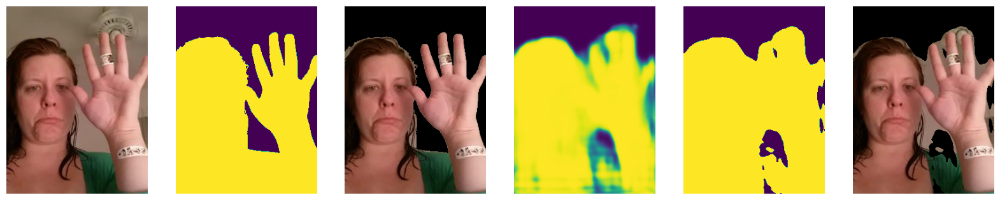

Epoch 129: avg train loss 0.521, avg dice 0.923
Epoch 130: avg train loss 0.527, avg dice 0.915
Epoch 131: avg train loss 0.550, avg dice 0.890
Epoch 132: avg train loss 0.545, avg dice 0.882
Epoch 133: avg train loss 0.521, avg dice 0.906
Epoch 134: avg train loss 0.518, avg dice 0.899
Epoch 135: avg train loss 0.516, avg dice 0.896
Epoch 136: avg train loss 0.514, avg dice 0.899
Epoch 137: avg train loss 0.511, avg dice 0.920
Epoch 138: avg train loss 0.512, avg dice 0.934
Epoch 139: avg train loss 0.517, avg dice 0.929
Epoch 140: avg train loss 0.515, avg dice 0.932
Epoch 141: avg train loss 0.512, avg dice 0.930
Epoch 142: avg train loss 0.505, avg dice 0.925
Epoch 143: avg train loss 0.508, avg dice 0.912
Epoch 144: avg train loss 0.510, avg dice 0.906


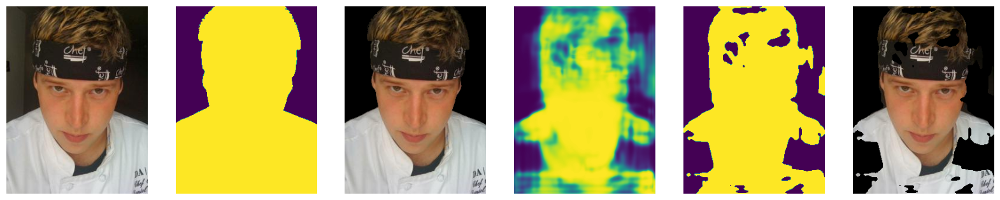

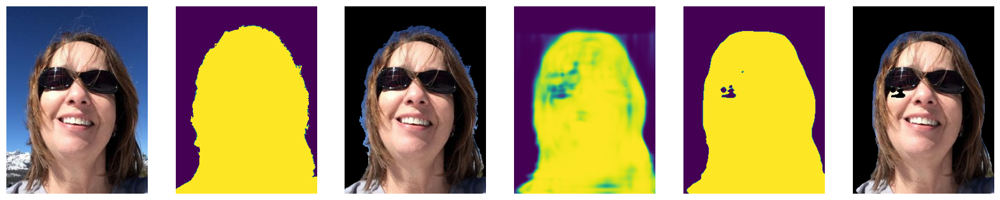

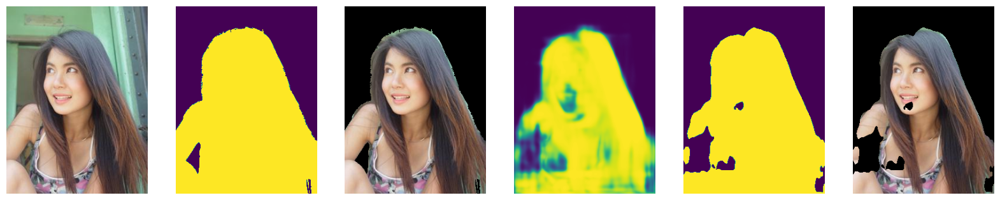

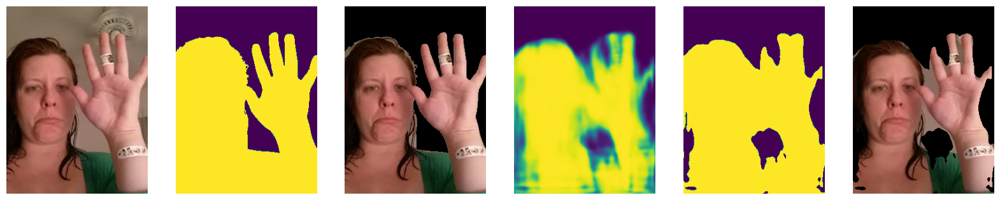

Epoch 145: avg train loss 0.510, avg dice 0.922
Epoch 146: avg train loss 0.508, avg dice 0.939
Epoch 147: avg train loss 0.512, avg dice 0.936
Epoch 148: avg train loss 0.507, avg dice 0.943
Epoch 149: avg train loss 0.499, avg dice 0.943
Epoch 150: avg train loss 0.499, avg dice 0.936
Epoch 151: avg train loss 0.505, avg dice 0.919
Epoch 152: avg train loss 0.498, avg dice 0.944
Epoch 153: avg train loss 0.505, avg dice 0.944
Epoch 154: avg train loss 0.508, avg dice 0.943
Epoch 155: avg train loss 0.500, avg dice 0.951
Epoch 156: avg train loss 0.495, avg dice 0.948
Epoch 157: avg train loss 0.497, avg dice 0.942
Epoch 158: avg train loss 0.497, avg dice 0.948
Epoch 159: avg train loss 0.498, avg dice 0.952
Epoch 160: avg train loss 0.502, avg dice 0.952


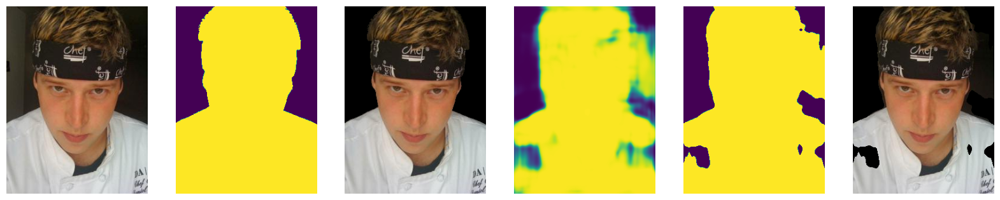

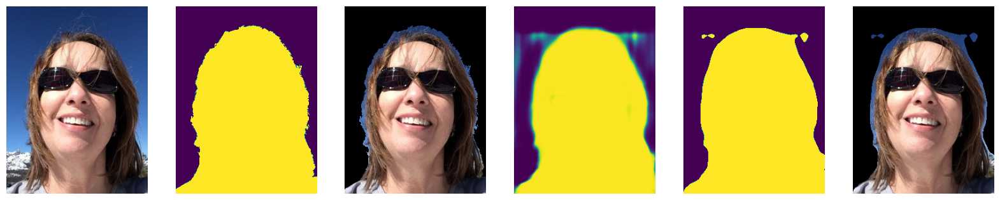

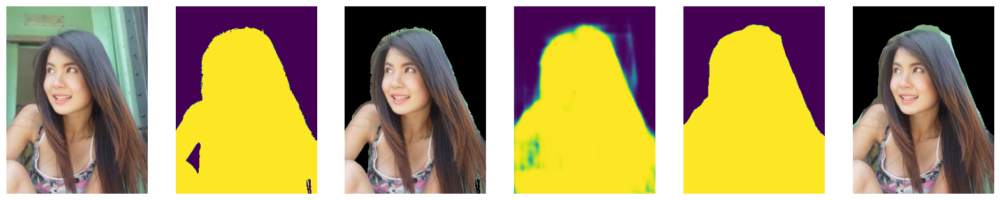

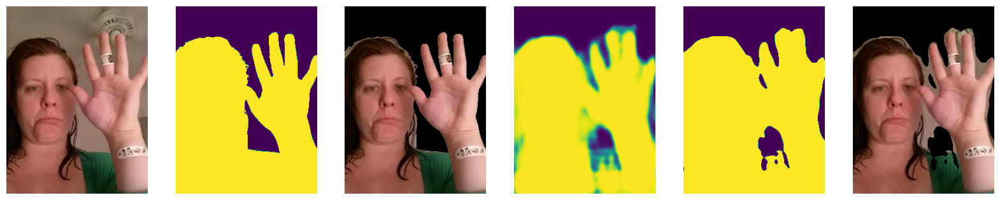

Epoch 161: avg train loss 0.496, avg dice 0.958
Epoch 162: avg train loss 0.492, avg dice 0.961
Epoch 163: avg train loss 0.492, avg dice 0.956
Epoch 164: avg train loss 0.493, avg dice 0.955
Epoch 165: avg train loss 0.491, avg dice 0.965
Epoch 166: avg train loss 0.493, avg dice 0.964
Epoch 167: avg train loss 0.495, avg dice 0.961
Epoch 168: avg train loss 0.489, avg dice 0.963
Epoch 169: avg train loss 0.490, avg dice 0.960
Epoch 170: avg train loss 0.493, avg dice 0.956
Epoch 171: avg train loss 0.491, avg dice 0.967
Epoch 172: avg train loss 0.499, avg dice 0.959
Epoch 173: avg train loss 0.495, avg dice 0.964
Epoch 174: avg train loss 0.487, avg dice 0.969
Epoch 175: avg train loss 0.493, avg dice 0.949
Epoch 176: avg train loss 0.492, avg dice 0.957


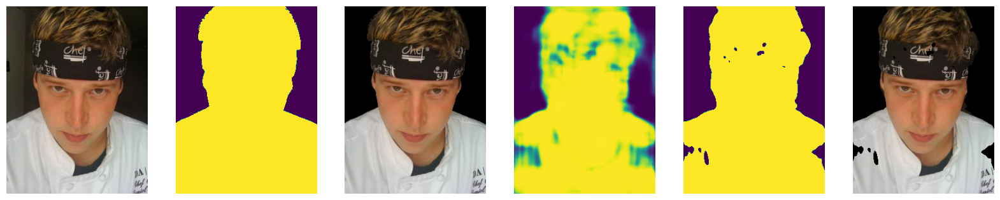

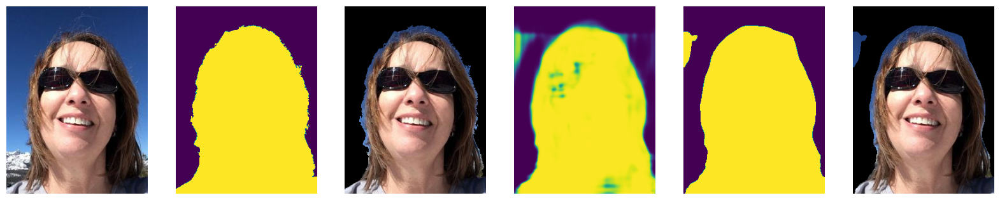

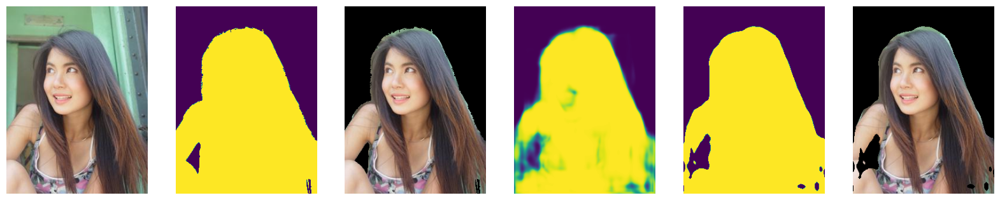

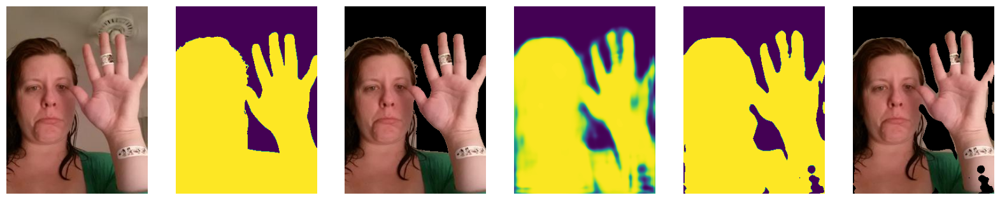

Epoch 177: avg train loss 0.491, avg dice 0.968
Epoch 178: avg train loss 0.497, avg dice 0.961
Epoch 179: avg train loss 0.490, avg dice 0.967
Epoch 180: avg train loss 0.490, avg dice 0.958
Epoch 181: avg train loss 0.487, avg dice 0.968
Epoch 182: avg train loss 0.490, avg dice 0.970
Epoch 183: avg train loss 0.492, avg dice 0.968
Epoch 184: avg train loss 0.485, avg dice 0.974
Epoch 185: avg train loss 0.486, avg dice 0.969
Epoch 186: avg train loss 0.485, avg dice 0.975
Epoch 187: avg train loss 0.493, avg dice 0.968
Epoch 188: avg train loss 0.486, avg dice 0.977
Epoch 189: avg train loss 0.485, avg dice 0.971
Epoch 190: avg train loss 0.484, avg dice 0.974
Epoch 191: avg train loss 0.485, avg dice 0.979


In [29]:
model = UNet(num_classes=1, num_filters=32)
optimizer = optim.Adam(model.parameters(), lr=3e-4)
criterion = nn.BCEWithLogitsLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model.to(device)

test_images, test_masks = next(iter(test_loader))

for epoch in range(0, 192):
    train_epoch(model, optimizer, test_loader, criterion, device=device)

    train_loss, train_dice = evaluate_loss(test_loader, model, criterion, device=device)
    #your code here    
    preds = torch.sigmoid(model(test_images.to(device))).cpu().detach()
    print(f"Epoch {epoch}: avg train loss {train_loss:.3f}, avg dice {train_dice:.3f}")

    if epoch % 16 == 0:
        for image, mask, pred in zip(test_images[:4], test_masks[:4], preds):
            show_image_with_mask(image.numpy().transpose(1, 2, 0), mask.numpy()[0], pred.numpy()[0])

Какие проблемы вы видите при обучении? Как можно улучшить качество?

Dice можно использовать и в качестве целевой функции - для этого надо превратить его в лосс:

In [30]:
def dice_loss(pred_tensor, target_tensor):
        
    loss = 1 - dice_coeff(pred_tensor, target_tensor)
    
    return loss

Эксперимент с обучением на таком лоссе сделайте сами. Что получится?

## UNet34

Хочется (как всегда) использовать мощь предобученных моделей. Но где взять такое для задачи сегментации?

In [31]:
from torchvision.models import resnet34

In [32]:
class ResNet34Encoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        model = resnet34(pretrained=True)
        
        self.pre = nn.Sequential(*[model.conv1, model.bn1, model.relu, model.maxpool])
        self.layer1 = model.layer1
        self.layer2 = model.layer2
        self.layer3 = model.layer3
        self.layer4 = model.layer4
        self.layers = [self.layer1, self.layer2, self.layer3, self.layer4]
        
    
    def forward(self, x):
        acts = []
        
        pre = self.pre(x)
        for layer in self.layers:
            pre = layer(pre)
            acts.append(pre)

In [33]:
x = torch.randn(4, 3, 512, 512)

In [34]:
encoder34 = ResNet34Encoder()

In [35]:
y = encoder(x)

In [36]:
for yi in y:
    print(yi.size())

torch.Size([4, 16, 512, 512])
torch.Size([4, 32, 256, 256])
torch.Size([4, 64, 128, 128])
torch.Size([4, 128, 64, 64])


## Дополнительные материалы

https://github.com/qubvel/segmentation_models.pytorch